Before you turn this assignment in, make sure everything runs as expected. First, **restart the kernel** (in the menubar, select Kernel$\rightarrow$Restart) and then **run all cells** (in the menubar, select Cell$\rightarrow$Run All).

Make sure you fill in any place that says `YOUR CODE HERE` or "YOUR ANSWER HERE", as well as your name and collaborators below:

In [25]:
NAME = "Andriy Kashyrskyy"
COLLABORATORS = ""

---


# CS110 LBA
# A day in the life of a Minervan—Part I

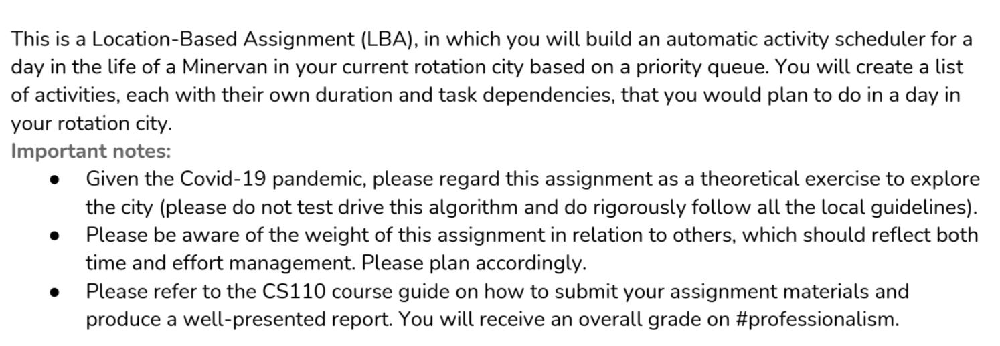

In [26]:
from IPython.display import Image
Image(filename="introduction_cs110.png")

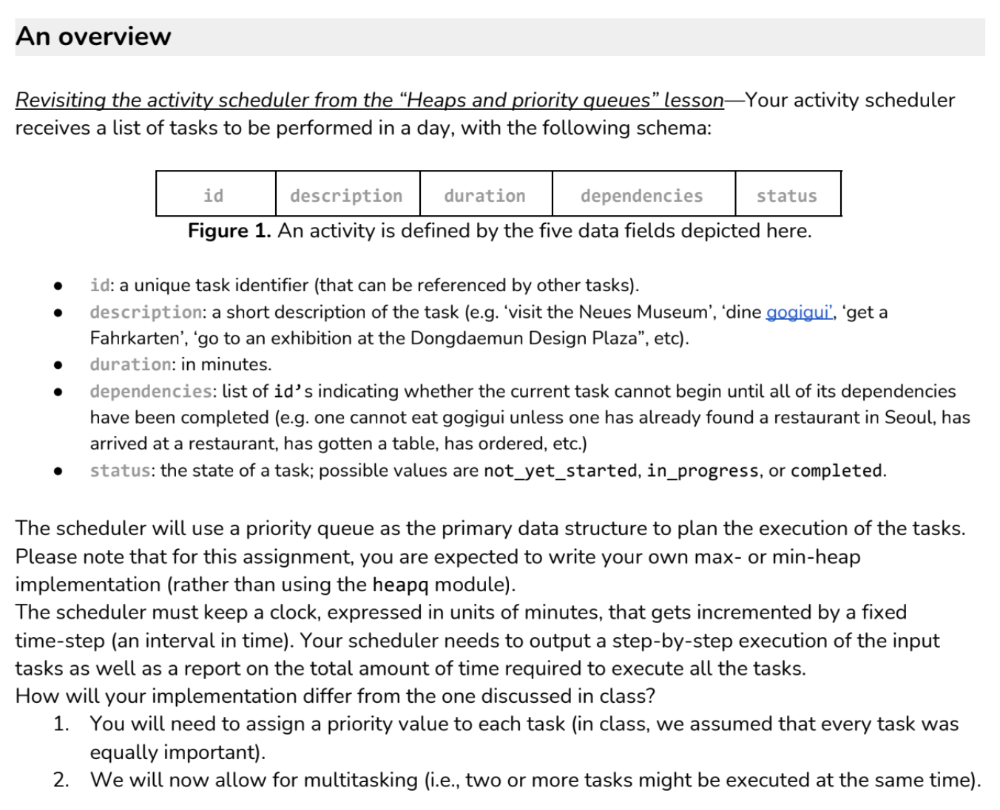

In [27]:
Image(filename="overview_cs110.png")

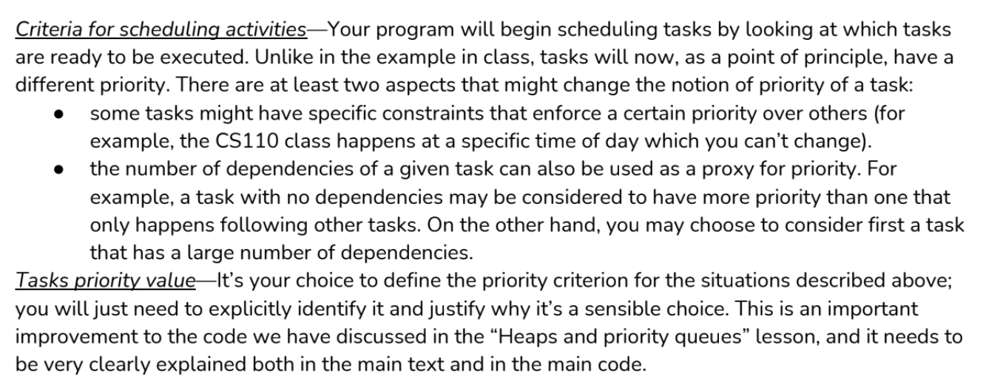

In [28]:
Image(filename="overview_2_cs110.png")

### Deliverables

## Question 0 [#responsibility]

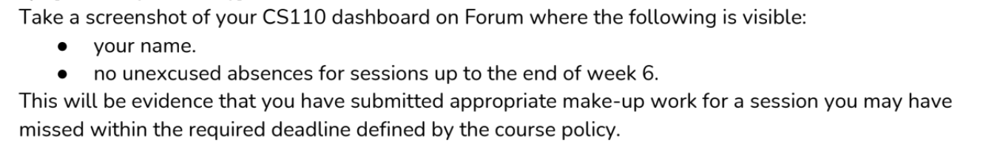

In [29]:
Image(filename="q_0_cs110.png")

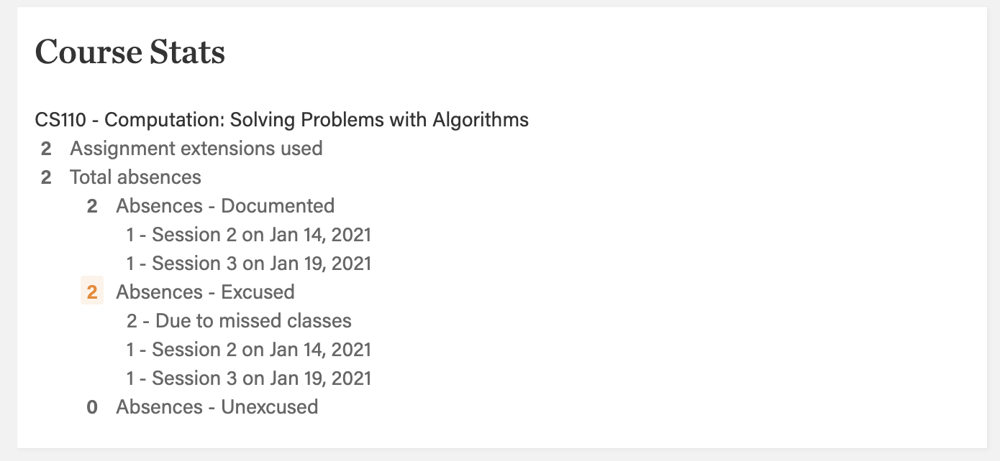

In [30]:
Image(filename="Class_CS110_LBA.png")

---

## Question 1 [#AlgorithmicStrategies, #DataStructures]


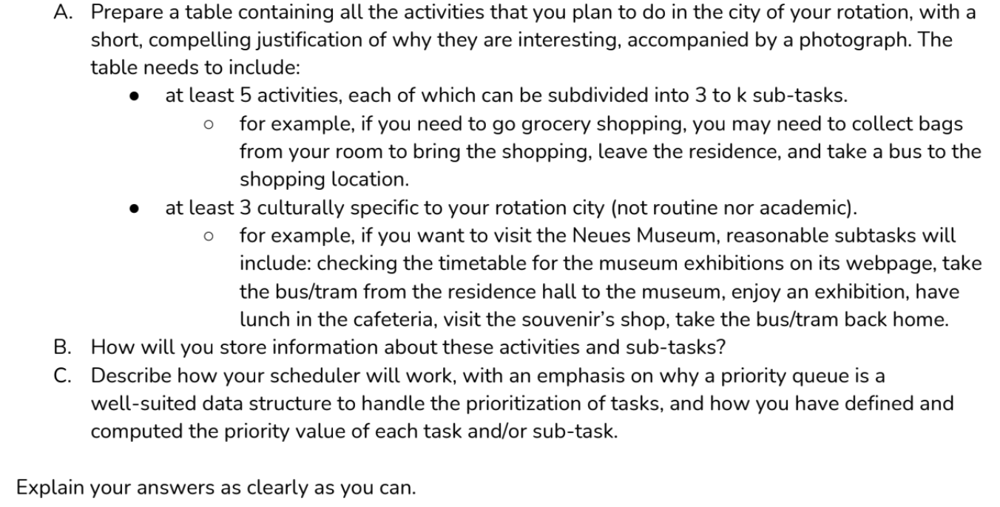

In [31]:
Image(filename="q_1_cs110.png")

## (A) Table with activities and sub-tasks.

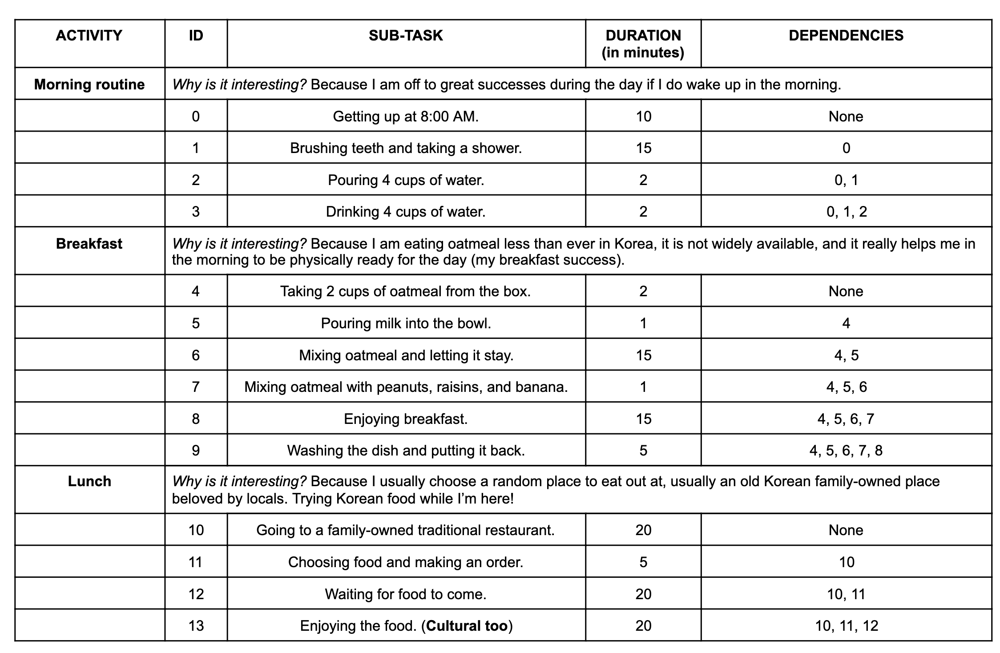

In [32]:
Image(filename="activities_0-13.png")

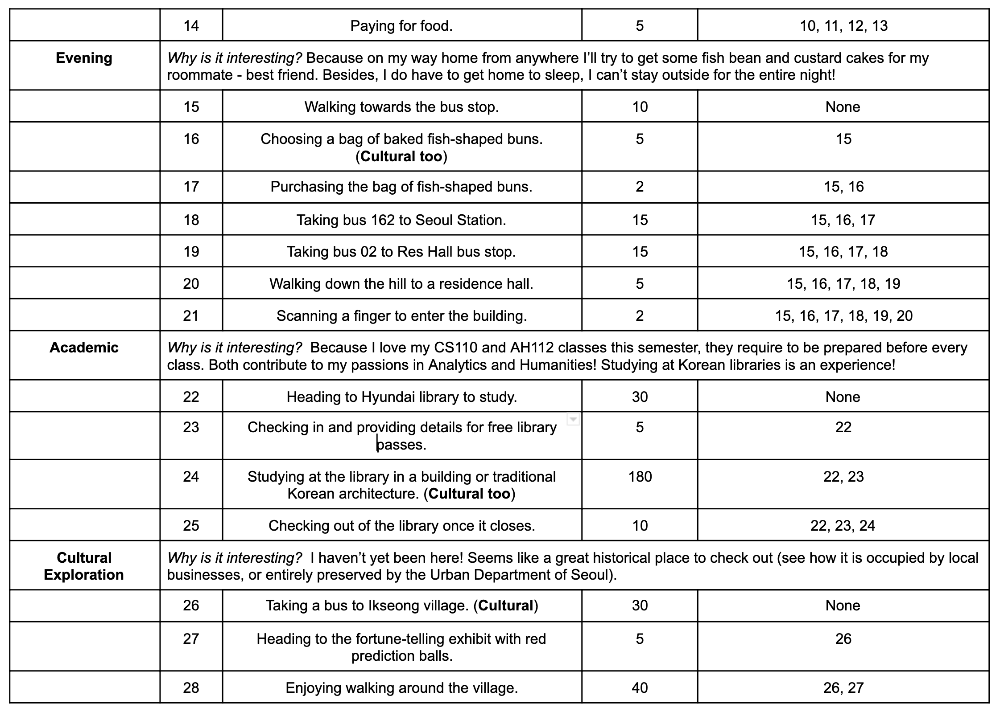

In [33]:
Image(filename="activities_14-28.png")

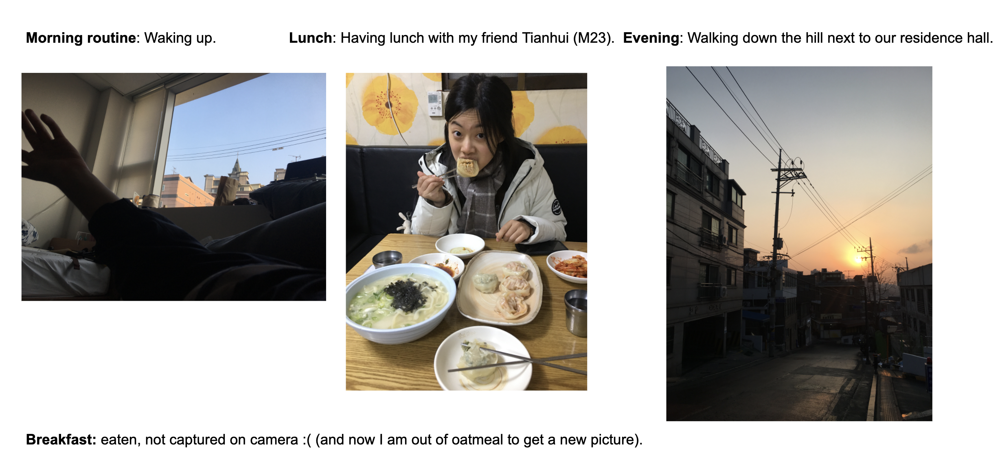

In [34]:
Image(filename="CS110LBA_photos_1.png")

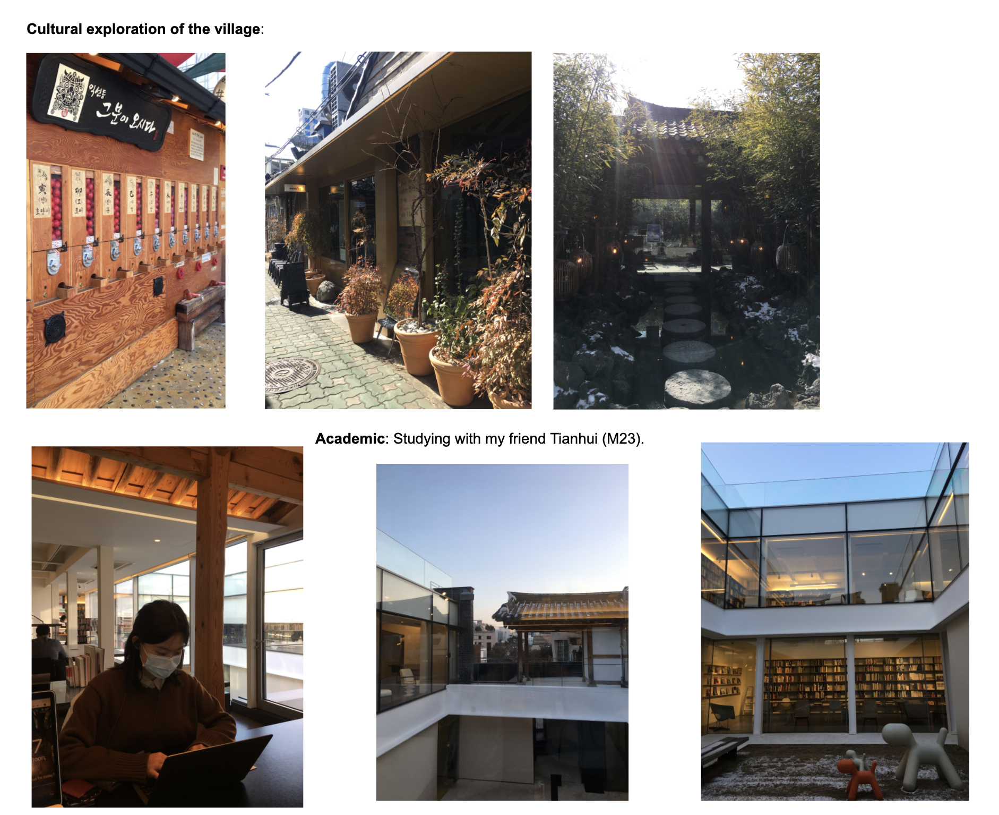

In [35]:
Image(filename="CS110LBA_photos_2.png")

## (B) How will I store the information about these activities and sub-tasks.
I will store all of these activities in a list (nested list), with inputs of each sublist corresponding to ID, description, duration, dependencies, and name of the activity subtask is a part of. 

For example, one of the entries will look like this:

[27, 'Heading to the fortune-telling exhibit with red prediction balls.', 5, [26], "cultural"], with its ID being 27, followed by description with a verb of -ing form, duration of 5 minutes, the dependency of activity with ID 26 ("Taking a bus to the Ikseong village"), and it being my major "cultural" category activity for the day.

## (C) How a scheduler will work, the reasoning behind usage of a priority queue, and how priority value is being defined.

I will define the MinHeapq module first, followed by a set of functions from the class session on Heaps and Priority Queues (5.2). I will utilize the similar algorithm we have observed in class - passing elements from the list, in our case - each task's ID, duration, AND priority score into the priority queue. The lowest priority score elements in the priority queue (heap with elements in a binary tree) will be popped continuously until the list of unscheduled tasks is empty or until the size of priority queue is bigger than, or equal to one; so I will be building a min-heap of the list that will be getting smaller and smaller in size, and I will pop out the root node element. 

I am also defining a priority score calculator function, which calculates particular activity's priority score based on the number of dependencies activity has and based on the priority of the main activity it relates to (the lowest priority score task should be executed earlier, that is why I am using a MinHeapq). I also initialize all the activities adding a variable of status by appending the default "Not_yet_started" to the end of each activity's sublist; this will be changed to "In_progress" if the task does not have any dependencies (in get_ready_tsks function).

Priority score can be broken down into (1) main activity's priority that I defined, for instance, morning routine has the lowest priority of 10, as it has to be executed first in the day, (2) subtask's priority between 2 and 10 (this can be seen from the function priority_calc). This priority score function calculates each subtask's score using a for loop through each element in the inputted list and inserts this score at the very beginning of the array of each task (thus shifting other elements by 1). Basically, in the priority calculator function, I force the less dependent activities to be performed first, and I prioritize certain activities (categories of activities) over others from the very beginning (which is "morning routine" < "breakfast" < "cultural" < "lunch" < "academic" < "evening," with the highest having a lower priority for the weekend day (that is why "academic" category has a lower priority than "cultural")).

---

## Question 2 [#PythonProgramming, #CodeReadability]


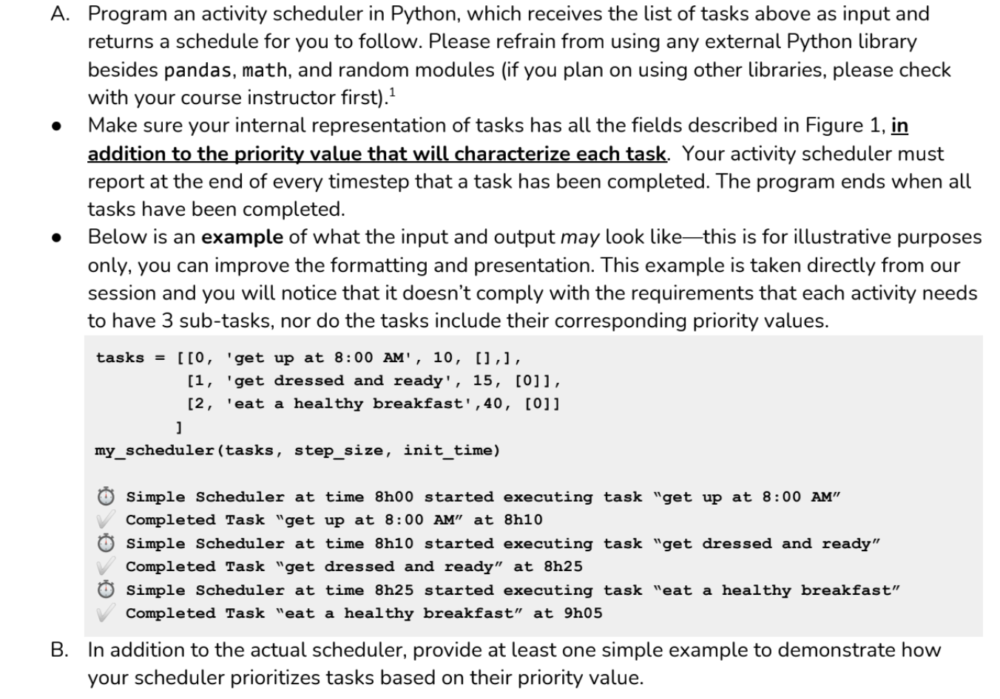

In [36]:
Image(filename="q_2_cs110.png")

## (A) Programming a scheduler using MinHeapq()

In [37]:
## I am reusing my own Pre-Class Work for Session 5.2, slightly changed for this task.

# Defining some basic binary tree functions
def left(i):             # left(i): takes as input the array index of a parent node in the binary tree and 
    return 2*i + 1       #          returns the array index of its left child.

def right(i):            # right(i): takes as input the array index of a parent node in the binary tree and 
    return 2*i + 2       #           returns the array index of its right child.

def parent(i):           # parent(i): takes as input the array index of a node in the binary tree and
    return (i-1)//2      #            returns the array index of its parent

class MinHeapq:
    """ 
    Defining a class that implements modules related to 
    a min priority queue data structure.
    
    Attributes
    ----------
    heap : list
        A Python list storing key values of the min heap
        
    heap_size : int
        An integer counter of the number of keys present in the min heap
        
    """ 
    
    def __init__(self):
        """
        This method performs class initialization. 
        
        """
        self.heap       = []
        self.heap_size  = 0

        
    def mink(self):
        """
        This method is returning the highest key in the min priority queue.
        
        """
        return self.heap[0] 
    
     
    def heappush(self, key):   
        """
        This method inserts the value of key onto the priority queue, 
        still maintaining the min heap invariant.
        
        """
        self.heap.append(float("inf"))
        self.decrease_key(self.heap_size,key)
        self.heap_size+=1
        
    def decrease_key(self, i, key): 
        """
        This method changes the value of a key in the priority queue 
        with a lower value. 
    
        """
        if self.heap[i] != float("inf") and key[0] > self.heap[i][0]:
            raise ValueError('The new key bigger than the current key!')
        self.heap[i] = key
        while i > 0 and self.heap[parent(i)][0] > self.heap[i][0]:
            j = parent(i)
            holder = self.heap[j]
            self.heap[j] = self.heap[i]
            self.heap[i] = holder
            i = j  
            
    def heapify(self, i):
        """
        Heapify method implements the min_heapify operation.
        for the priority queue. 
        Input: the index of the root node.
        
        """
        l = left(i)
        r = right(i)
        heap = self.heap
        if l <= (self.heap_size-1) and heap[l][0] < heap[i][0]:
            lowest = l
        else:
            lowest = i
        if r <= (self.heap_size-1) and heap[r][0] < heap[lowest][0]:
            lowest = r
        if lowest != i:
            heap[i], heap[lowest] = heap[lowest], heap[i]
            self.heapify(lowest)


    def heappop(self):
        """
        The method is implementing the extract_min operation. 
        With this method we return the lowest key in the min priority queue 
        and then we remove the key from the priority queue.
        
        """
        if self.heap_size < 1:
            print('There are no keys in the priority queue.')
        mink = self.heap[0]
        self.heap[0] = self.heap[-1]
        self.heap.pop()
        self.heap_size-=1
        self.heapify(0)
        return mink

In [38]:
"""
A Weekend Day Task Scheduler Using Priority Queues
"""

## I am using some of the functions from Class Session 5.2 Breakout, slightly changed for this task (deleted print function, added priority score calculation function).

def initialize_tasks( tsks ):
    """
    Function initializing all tasks with default status (not yet in the priority queue), appending "Not_yet_started".
    Input: list of tasks 
    """  
    for i in range(len(tsks)):
        tsks[i].append('Not_yet_started')
        
def unscheduled_tasks( tsks ):
    """
    Function checksing the status of ALL tasks and returning `True` if there exists at least one task with a status = 'Not_yet_started')
    Input: list of tasks 
    Output: boolean 
    """
    for t in tsks:
        if t[6] == 'Not_yet_started':
            return True
    return False
       
def remove_dependency( tsks, tid ):
    """
    Input: list of tasks and task_id of the task just completed
    Output: lists of tasks with t_id removed
    """
    ## checking for dependencies and removing them if a dependency is already executed
    for t in range(len(tsks)):
        if tsks[t][1] != tid and tid in tsks[t][4]:
            tsks[t][4].remove(tid)
            
def get_ready_tsks( tsks ):
    """ 
    Input: list of tasks
    Output: list of tasks ready to execute
    """
    ## creating an empty list for tasks that are ready
    rtsks = []
    ## checking the status for each task, changing the ones to be execute to "In_progress"
    for i in range(len(tsks)):
        if tsks[i][6] == 'Not_yet_started' and not tsks[i][4]: # If a task has no dependencies and not yet in a queue
            tsks[i][6] = 'In_progress' # Changing status of the task
            rtsks.append((tsks[i][0],tsks[i][3],tsks[i][1]))  # adding priority_score, duration, task_id
                                                              # to be pushed onto the priority queue                                      
    return rtsks

def priority_calc(tsks):
    ## print('Input List of Tasks with calculated Priority Score:')
    for t in range(len(tsks)):
        ## calculating the number of dependencies 
        n_depend = len(tsks[t][3])
        
        ## conditions to check and insert (at the beginning of the list) the score
        if n_depend == 0:
            tsks[t].insert(0, 2)
        if n_depend == 1:
            tsks[t].insert(0, 4)
        if n_depend > 1 and n_depend <= 3:
            tsks[t].insert(0, 6)
        if n_depend > 3 and n_depend <= 5:
            tsks[t].insert(0, 8)
        if n_depend > 5 and n_depend < float("inf"):
            tsks[t].insert(0, 10)
        
        ## conditions to check the activity category of task and add certain number to the priority score if the condition is met
        if tsks[t][5] == "morning_routine":
            tsks[t][0]+= 10
        if tsks[t][5] == "breakfast":
            tsks[t][0]+= 20
        if tsks[t][5] == "cultural":
            tsks[t][0]+= 30
        if tsks[t][5] == "lunch":
            tsks[t][0]+= 35
        if tsks[t][5] == "academic":
            tsks[t][0]+= 40 
        if tsks[t][5] == "evening":
            tsks[t][0]+= 50
            
    ## printing an updated list of tasks by for loop running through all tasks
    ## too lengthy to print and the output is not pretty - we can uncomment and print if needed
    ## for t in tasks:
        ## print(f"task: {t[1]} \t {t[2]} \t duration: {t[3]} \t depends on: {t[4]} \t Status: {t[6]} \t Priority Score: {t[0]}")

def add_tasks_pqueue(pqueue, rtsks):
    """ 
    Function to add tasks onto the priority queue.
    Input: list of tasks
    Output: priority queue (created using MinHeapq class object, as we will make pqueue=MinHeapq())
    """  
    if rtsks:
        if not pqueue:  # If the priority queue does not exist, we create one
            pqueue = rtsks
            ### We make pqueue a priority queue using heapify module
            pqueue.heapify()
        else:
            for t in rtsks:
                ### if the priority queue is already created, we insert new elements into the queue
                pqueue.heappush(t)
    return pqueue

In [39]:
## defining a time_scheduler function

def time_scheduler(tasks, step_sz, hour, minutes):
    """
    This function takes the given list of tasks, 
    initializes and calculates priority scores for each task.
    Then it uses modules of MinHeapq() and priority queue strategy
    to execute the tasks with lowest score (= highest priority) value first.
    
    Input: nested list of tasks in a form with each sublist having 
          [id, description, duration, dependencies]
           step_sz = time step size in minutes
           hour = current time in hours (between 0 and 24)
           minutes = current minutes (between 0 and 59)
    Output: schedule for the day to execute the tasks one by one, 
            along with the time schedule.
    """
    c_time = hour*60 + minutes #calculating current time in minutes
    pqueue = MinHeapq() # we make pqueue a MinHeapq() class object to use different modules we defined within MinHeapq()
    # STEP 0: we initialize the status of all tasks list of input
    initialize_tasks(tasks)
    ## STEP 0.1: we calculate the priority using priority calculation function
    ## we also print the tasks after initializing and adding priority score
    priority_calc(tasks)
    ## here we run the while loop while the list of unscheduled tasks has elements
    ## (while unscheduled tasks exist) or until the size of priotity queue is bigger than, or equal to 1
    while unscheduled_tasks(tasks) or pqueue.heap_size >= 1:
        #STEP 1: we extract tasks ready to be executed 
        rtsks = get_ready_tsks(tasks)
        #STEP 2: we push the tasks onto the priority queue
        pqueue = add_tasks_pqueue(pqueue, rtsks)
        #STEP 3: we check for tasks in the priority queue
        if pqueue:          
            #STEP 4: we get the tasks on top of the priority queue        
            (priority, rtime, tid) = pqueue.heappop()
            print(f" ⏰Scheduler at time: {c_time//60}:{c_time%60:02d} start '{tasks[tid][2]}' Remaining time for this task: {rtime} minutes.")
            tstep = step_sz     # tstep represents the scheduler's time step
            if rtime < step_sz: # if less than the step_size, we take a smaller time step
                tstep = rtime
            rtime -= tstep  # STEP 5: we adjust the remaining time of the task
            c_time += tstep # we update the schedulers clock
            print(f"Time: {c_time//60}h{c_time%60:02}")
            if rtime == 0:  # STEP 7: remaining time is zero - task has completed
                print(f"☑️Completed Task - '{tasks[tid][2]}' at time {c_time//60}:{c_time%60:02}.") 
                ## if the task is completed, we remove it from the dependency list of all the tasks that depend on it
                remove_dependency(tasks, tid)
                print("✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨")
            else:
                ## if the task is not finished, it is pushed back onto the priority queue with the updated remaining time
                pqueue.heappush((priority, rtime, tid))
    print("✨✨✨ Oh, no activities left! ✨✨✨")
    print("🥳🎉🥂You have completed all planned tasks for today.")
    print("Wow! You spent", (c_time//60)-8, "hours and", c_time%60, "minutes outside completing your list of", len(tasks), "activities!")

## (B) Example of time_scheduler() application with my list of tasks for LBA.

In [40]:
## my list of tasks
tasks = [
    [0, 'Getting up at 8:00 AM.', 10, [],"morning_routine"],
    [1, 'Brushing teeth & taking a shower.', 15, [0], "morning_routine"],
    [2, 'Pouring 4 cups of water.', 2, [0,1], "morning_routine"],
    [3, 'Drinking 4 cups of water.', 2,[0,1,2], "morning_routine"],
    [4, 'Taking 2 cups of oatmeal from the box.', 2,[], "breakfast"],
    [5, 'Pouring milk into the bowl.', 1,[4], "breakfast"],
    [6, 'Mixing oatmeal and letting it stay.', 15,[4,5], "breakfast"],
    [7, 'Mixing oatmeal with peanuts, raisins, and banana.', 1, [4,5,6], "breakfast"],
    [8, 'Enjoying breakfast.', 15, [4,5,6,7],"breakfast"],
    [9, 'Washing the dish and putting it back.', 5,[4,5,6,7,8], "breakfast"],
    [10, 'Going to a family-owned traditional restaurant.', 20, [], "lunch"],
    [11, 'Choosing food and making an order.', 5,[10], "lunch"],
    [12, 'Waiting for food to come.', 20,[10,11], "lunch"],
    [13, 'Enjoying the food.', 20,[10,11,12], "lunch"],
    [14, 'Paying for food.', 5,[11,12,13], "lunch"],
    [15, 'Walking towards the bus stop.', 10, [],"evening"],
    [16, 'Choosing a bag of baked fish-shaped buns.', 5, [15],"evening"],
    [17, 'Purchasing the bag of fish-shaped buns.', 2, [15,16],"evening"],
    [18, 'Taking bus 162 to Seoul Station.', 15,[15], "evening"],
    [19, 'Taking bus 02 to Res Hall bus stop.', 15,[15,18], "evening"],
    [20, 'Walking down the hill to a residence hall.', 5,[15,18,19], "evening"],
    [21, 'Scanning a finger to enter the building.', 2,[15,18,19,20], "evening"],
    [22, 'Heading to Hyundai library to study.', 30, [],"academic"],
    [23, 'Checking in and providing details for free library passes.', 5, [22],"academic"],
    [24, 'Studying at the library in a building or traditional Korean architecture.', 180,[22,23],"academic"],
    [25, 'Checking out of the library once it closes.', 10,[23,24],"academic"],
    [26, 'Taking a bus to Ikseong village.', 30, [],"cultural"],
    [27, 'Heading to the fortune-telling exhibit with red prediction balls.', 5, [26],"cultural"],
    [28, 'Enjoying walking around the village.', 40, [26,27], "cultural"]
]

## applying the function
time_scheduler(tasks, step_sz=30, hour=8, minutes=0)

 ⏰Scheduler at time: 8:00 start 'Getting up at 8:00 AM.' Remaining time for this task: 10 minutes.
Time: 8h10
☑️Completed Task - 'Getting up at 8:00 AM.' at time 8:10.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:10 start 'Brushing teeth & taking a shower.' Remaining time for this task: 15 minutes.
Time: 8h25
☑️Completed Task - 'Brushing teeth & taking a shower.' at time 8:25.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:25 start 'Pouring 4 cups of water.' Remaining time for this task: 2 minutes.
Time: 8h27
☑️Completed Task - 'Pouring 4 cups of water.' at time 8:27.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:27 start 'Drinking 4 cups of water.' Remaining time for this task: 2 minutes.
Time: 8h29
☑️Completed Task - 'Drinking 4 cups of water.' at time 8:29.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:29 start 'Taking 2 cups of oatmeal from the box.' Remaining time for this task: 2 minutes.
Time: 8h31
☑️Completed Task - 'T

---

## Question 3 [#AlgorithmicStrategies]

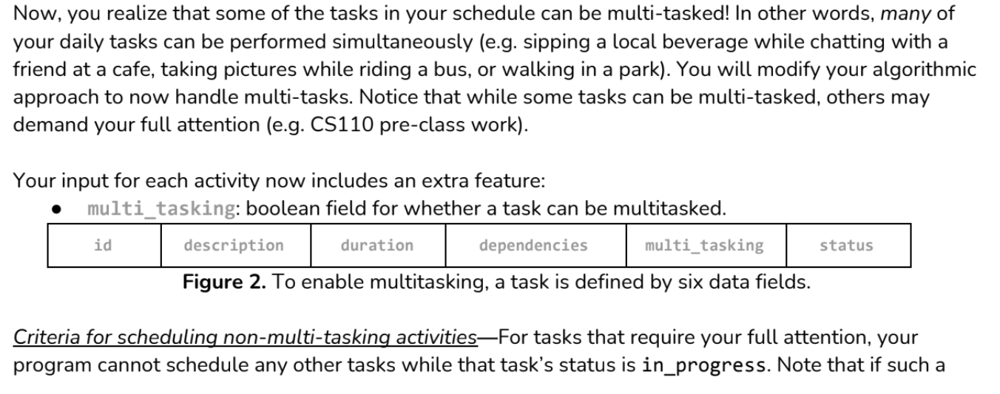

In [41]:
Image(filename="q_3_cs110.png")

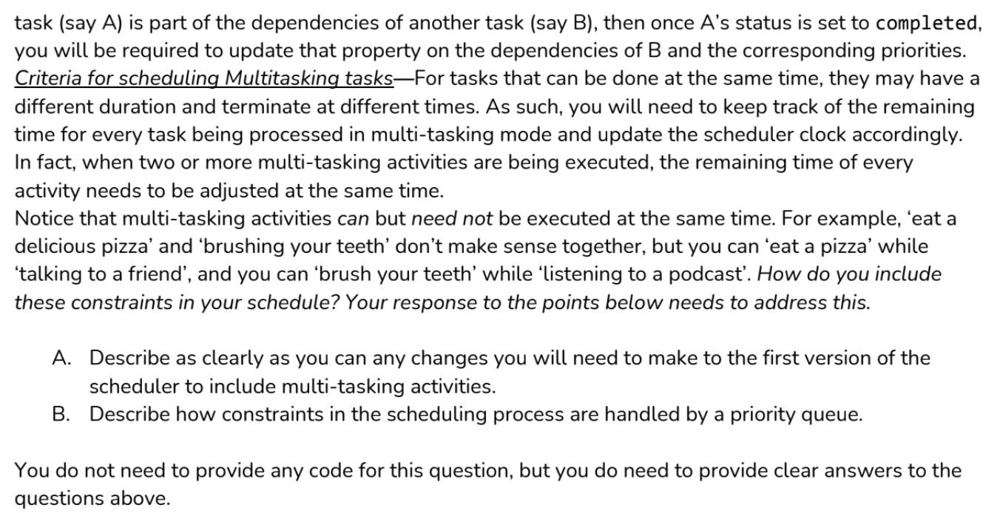

In [42]:
Image(filename="q_3_1_cs110.png")

## (A)
The change I will be making to my first approach is adding another nested list of tasks that can be performed together with the main list tasks (I thought of random tasks I can do throughout the day). For such change to be implemented and executed, I am adding additional if statements in the while loop of the time_scheduler function, which does multitasking if the multitasks nested list is not empty and if the remaining time is between the minimum and maximum values of multitasks duration (interval [min(multitasks), max(multitasks)]); I randomly choose the task from that list, and if the remaining time is bigger than that task, I execute the task and remove it from the list of multitasks; if it is not bigger - I do not remove the task of multitasks list; I also count how many multitasks are accomplished throughout the day. When the time scheduler runs, and if all conditions are met, an action print statement will be executed saying what tasks I should do simultaneously and at what times.

By doing these changes, I define a new function time_scheduler_multi that takes into arguments a list of tasks, a list of multi_tasks, step size, and current time in minutes).

## (B)

The priority queue allows to execute of tasks with the lowest priority score only (it does so for tasks with the least number of dependencies and a priority of a specific category of activity); the constraint of time helps to push the activity back into the function if the remaining time is not equal to 0 so that it will still be of the lowest score to be the root node of the minimum heap, to be popped a few times, until the remaining time is equal to 0 - then the dependency is removed from the dependencies of all other tasks.

---

## Question 4 [#PythonProgramming, #CodeReadability]

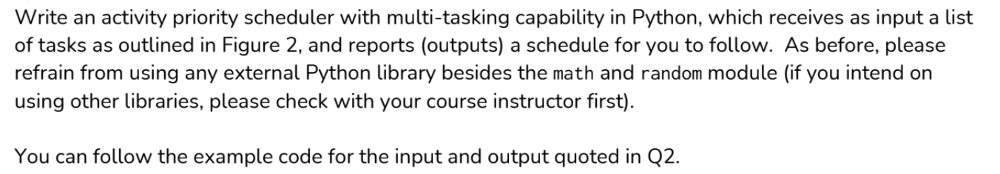

In [43]:
Image(filename="q_4_cs110.png")

In [44]:
## defining a time_scheduler function
## the function requires random module
import random 

def time_scheduler_multi(tasks, multi_tasking, step_sz, hour, minutes):
    """
    This function takes the given list of tasks, 
    initializes and calculates priority scores for each task.
    Then it uses modules of MinHeapq() and priority queue strategy
    to execute the tasks with lowest score (= highest priority) value first.
    
    Input: nested list of tasks in a form with each sublist having 
          [id, description, duration, dependencies]
           step_sz = time step size in minutes
           hour = current time in hours (between 0 and 24)
           minutes = current minutes (between 0 and 59)
    Output: schedule for the day to execute the tasks one by one, 
            along with the time schedule.
    """
    c_time = hour*60 + minutes #calculating current time in minutes
    pqueue = MinHeapq() # we make pqueue a MinHeapq() class object to use different modules we defined within MinHeapq()
    # STEP 0: we initialize the status of all tasks list of input
    initialize_tasks(tasks)
    initialize_tasks(multi_tasking)
    ## STEP 0.1: we calculate the priority using priority calculation function
    ## we also print the tasks after initializing and adding priority score
    priority_calc(tasks)
    priority_calc(multi_tasking) 
    n_multi = len(multi_tasking)
    ## here we run the while loop while the list of unscheduled tasks has elements
    ## (while unscheduled tasks exist) or until the size of priotity queue is bigger than, or equal to 1
    count_multitasks = 0 ## count for how many (multi)tasks we completed
    while unscheduled_tasks(tasks) or pqueue.heap_size >= 1:
        #STEP 1: we extract tasks ready to be executed 
        rtsks = get_ready_tsks(tasks)
        #STEP 2: we push the tasks onto the priority queue
        pqueue = add_tasks_pqueue(pqueue, rtsks)
        #STEP 3: we check for tasks in the priority queue
        if pqueue:          
            #STEP 4: we get the tasks on top of the priority queue        
            (priority, rtime, tid) = pqueue.heappop()
            print(f" ⏰Scheduler at time: {c_time//60}:{c_time%60:02d} start '{tasks[tid][2]}' Remaining time for this task: {rtime} minutes.")
            tstep = step_sz     # tstep represents the scheduler's time step
            if rtime < step_sz: # if less than the step_size, we take a smaller time step
                tstep = rtime
                if multi_tasking: # if multitasking list is not empty
                    # randomly choosing a task that can be multitasked
                    # if remaining time is on the interval of [min, max] of duration of tasks that can be perfomed simultaneously with other task
                    if rtime >= min(m[3] for m in multi_tasking) and rtime <= max(m[3] for m in multi_tasking):
                        m_task = random.choice(multi_tasking)
                        if rtime >= m_task[3]: # additional condition to have remaining time bigger than multitask's time
                            print("🤑Extra time to multitask! Also", m_task[2], "for", m_task[3], "minute(s).")
                            multi_tasking.remove(m_task) # removing a task from the multitask list
                            count_multitasks+=1 # adding to a count of multitasks
            rtime -= tstep  # STEP 5: we adjust the remaining time of the task
            c_time += tstep # we update the schedulers clock
            print(f"Time: {c_time//60}h{c_time%60:02}")
            if rtime == 0:  # STEP 7: remaining time is zero - task has completed
                print(f"☑️Completed Task - '{tasks[tid][2]}' at time {c_time//60}:{c_time%60:02}.") 
                ## if the task is completed, we remove it from the dependency list of all the tasks that depend on it
                remove_dependency(tasks, tid)
                print("✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨")
            else:
                ## if the task is not finished, it is pushed back onto the priority queue with the updated remaining time
                pqueue.heappush((priority, rtime, tid))
    print("✨✨✨ Oh, no activities left! ✨✨✨")
    print("🥳🎉🥂You have completed all planned tasks for today.")
    print("Wow! You spent", (c_time//60)-8, "hours and", c_time%60, "minutes completing your list of", len(tasks), "activities,", "along with", count_multitasks, "(out of", n_multi, "in total) extra activities while multitasking!" )

In [45]:
## my list of tasks
tasks = [
    [0, 'Getting up at 8:00 AM.', 10, [],"morning_routine"],
    [1, 'Brushing teeth & taking a shower.', 15, [0], "morning_routine"],
    [2, 'Pouring 4 cups of water.', 2, [0,1], "morning_routine"],
    [3, 'Drinking 4 cups of water.', 2,[0,1,2], "morning_routine"],
    [4, 'Taking 2 cups of oatmeal from the box.', 2,[], "breakfast"],
    [5, 'Pouring milk into the bowl.', 1,[4], "breakfast"],
    [6, 'Mixing oatmeal and letting it stay.', 15,[4,5], "breakfast"],
    [7, 'Mixing oatmeal with peanuts, raisins, and banana.', 1, [4,5,6], "breakfast"],
    [8, 'Enjoying breakfast.', 15, [4,5,6,7],"breakfast"],
    [9, 'Washing the dish and putting it back.', 5,[4,5,6,7,8], "breakfast"],
    [10, 'Going to a family-owned traditional restaurant.', 20, [], "lunch"],
    [11, 'Choosing food and making an order.', 5,[10], "lunch"],
    [12, 'Waiting for food to come.', 20,[10,11], "lunch"],
    [13, 'Enjoying the food.', 20,[10,11,12], "lunch"],
    [14, 'Paying for food.', 5,[11,12,13], "lunch"],
    [15, 'Walking towards the bus stop.', 10, [],"evening"],
    [16, 'Choosing a bag of baked fish-shaped buns.', 5, [15],"evening"],
    [17, 'Purchasing the bag of fish-shaped buns.', 2, [15,16],"evening"],
    [18, 'Taking bus 162 to Seoul Station.', 15,[15], "evening"],
    [19, 'Taking bus 02 to Res Hall bus stop.', 15,[15,18], "evening"],
    [20, 'Walking down the hill to a residence hall.', 5,[15,18,19], "evening"],
    [21, 'Scanning a finger to enter the building.', 2,[15,18,19,20], "evening"],
    [22, 'Heading to Hyundai library to study.', 30, [],"academic"],
    [23, 'Checking in and providing details for free library passes.', 5, [22],"academic"],
    [24, 'Studying at the library in a building or traditional Korean architecture.', 180,[22,23],"academic"],
    [25, 'Checking out of the library once it closes.', 10,[23,24],"academic"],
    [26, 'Taking a bus to Ikseong village.', 30, [],"cultural"],
    [27, 'Heading to the fortune-telling exhibit with red prediction balls.', 5, [26],"cultural"],
    [28, 'Enjoying walking around the village.', 40, [26,27], "cultural"]
]

multi_tasking = [
    [29, 'call family', 5, [], "multitask"], 
    [30, 'listen to music', 5, [], "multitask"],
    [31, 'listen to a podcast', 5, [], "multitask"],
    [32, 'check feedback for CS110 Preclass Work', 5, [], "multitask"],
    [33, 'compose a 4-line poem in your head', 5, [], "multitask"],
    [35, 'listen to music', 5, [], "multitask"],
    [36, 'text a friend and say hi', 3, [], "multitask"],
    [37, 'drink a bit of water', 1, [], "multitask"],
    [38, 'think about Final Project for CS110', 4, [], "multitask"],
    [39, 'think about Final Project for AH112', 4, [], "multitask"],
    [40, 'brainstorm ideas for to-do-list next weekend', 5, [], "multitask"],
    [41, 'call a friend', 10, [], "multitask"], 
    [42, 'drink a bit of water', 1, [], "multitask"], 
]

## applying the function
time_scheduler_multi(tasks, multi_tasking, step_sz=30, hour=8, minutes=0)

 ⏰Scheduler at time: 8:00 start 'Getting up at 8:00 AM.' Remaining time for this task: 10 minutes.
🤑Extra time to multitask! Also check feedback for CS110 Preclass Work for 5 minute(s).
Time: 8h10
☑️Completed Task - 'Getting up at 8:00 AM.' at time 8:10.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:10 start 'Brushing teeth & taking a shower.' Remaining time for this task: 15 minutes.
Time: 8h25
☑️Completed Task - 'Brushing teeth & taking a shower.' at time 8:25.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:25 start 'Pouring 4 cups of water.' Remaining time for this task: 2 minutes.
Time: 8h27
☑️Completed Task - 'Pouring 4 cups of water.' at time 8:27.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:27 start 'Drinking 4 cups of water.' Remaining time for this task: 2 minutes.
Time: 8h29
☑️Completed Task - 'Drinking 4 cups of water.' at time 8:29.
✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨
 ⏰Scheduler at time: 8:29 start 'Taking 2 cups of oatmeal f

---

## Question 5 [#ComputationalCritique]

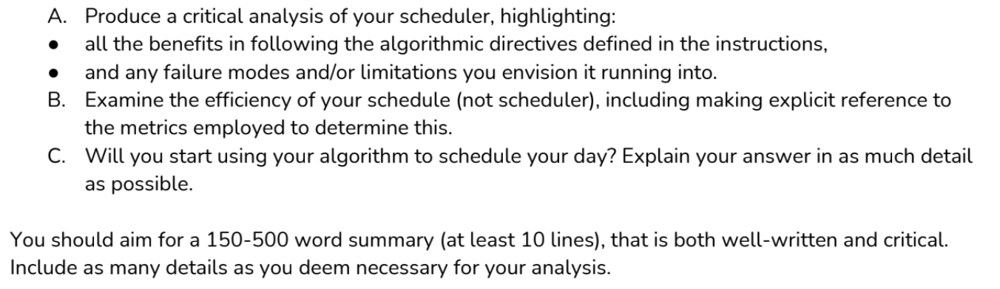

In [46]:
Image(filename="q_5_cs110.png")

## (A), (B)

Starting with limitations, I realize the downside of using my algorithm for multitasking is that you can never be guaranteed to execute all extra multitask-available activities (in my case, it was 13 of them). To see how that scales over multiple runs of the algorithm, I proceed to run an experiment seeing how well the scheduler works with multitasking (how many tasks from multitasks list are executed, as a fraction of multitasks executed/all multitasks); for that, I will run time scheduler a large number of times (n=1000, where n is the number of times to run the algorithm) counting the variable multitasks_completed, appending those to a list (initially empty, at the end with 1000 values of multitasks completed/len(all multitasks). I will plot the histogram and PDF (closely related to the distribution curve) as an output of this experiment, using only the pandas package. I define the function time_scheduler_multi_experimental(), which follows the same steps as the previous two tasks, just the print statements are hidden, and we only return a number of multitasks (when if statement conditions are met - we increase the count of multitasks by 1). I also define the function experimental_multi_count(), which plots the histogram and Probability Density Function based on a data frame of all 1000 values of multitasks completed.

From my analysis, I note that I will accomplish on average around 80% of my extra multitask activities by using the scheduler. While that seems not too ineffective, it can certainly be improved by using MinHeapq() for the list of multitasks. By implementing an algorithm that will run multiple tasks simultaneously, taking the single input of tasks with variable multi_tasking.

Another limitation is that I prioritized categories of activities within the priority calculation function, while this priority in real life can be updated on a weekly or even daily basis, regardless of whether it is a weekday or a day during the weekend. My scheduler included priority calculations based on the weekend. It can be improved by extending the function to have an additional argument of the day of the week (with the weekend prioritizing cultural over academic, for instance).

The benefit is that using priority queue and min heap allows to go through all elements quickly, get updates on the activity every 30 minutes (while it is being executed), or less if the action is less than 30 minutes (or another step size that is defined). The function's output tells at which times an activity should be started and when it should end, also adding a multitask if it is meeting conditions to be executed at that same time.

To examine the scheduler's efficiency, I am running the experiment below (seeing how successful I am in accomplishing the tasks that can be multitasked out of the ones planned for the day). As for the schedule, all tasks from the main list of tasks are executed; however, it seems that in some cases, randomly picking a multitask can be ineffective as it might not be suitable for the other (primary) task performed; thus this is another issue I should resolve.

In [47]:
## because of the experiment I hide all print statements, 
## as we are only interested in count_multitasks
import random 

def time_scheduler_multi_experimental(task_list, multi_list, step_sz, hour, minutes):
    """
    This function takes the given list of tasks, 
    initializes and calculates priority scores for each task.
    Then it uses modules of MinHeapq() and priority queue strategy
    to execute the tasks with lowest score (= highest priority) value first.
    
    Input: nested list of tasks in a form with each sublist having 
          [id, description, duration, dependencies]
           step_sz = time step size in minutes
           hour = current time in hours (between 0 and 24)
           minutes = current minutes (between 0 and 59)
    Output: schedule for the day to execute the tasks one by one, 
            along with the time schedule.
    """
    c_time = hour*60 + minutes #calculating current time in minutes
    pqueue = MinHeapq() # we make pqueue a MinHeapq() class object to use different modules we defined within MinHeapq()
    # STEP 0: we initialize the status of all tasks list of input
    initialize_tasks(task_list)
    initialize_tasks(multi_list)
    ## STEP 0.1: we calculate the priority using priority calculation function
    ## we also print the tasks after initializing and adding priority score
    priority_calc(task_list)
    priority_calc(multi_list) 
    n_multi = len(multi_list)
    ## here we run the while loop while the list of unscheduled tasks has elements
    ## (while unscheduled tasks exist) or until the size of priotity queue is bigger than, or equal to 1
    multitasks_completed = 0 ## count for how many (multi)tasks we completed
    while unscheduled_tasks(task_list) or pqueue.heap_size >= 1:
        #STEP 1: we extract tasks ready to be executed 
        rtsks = get_ready_tsks(task_list)
        #STEP 2: we push the tasks onto the priority queue
        pqueue = add_tasks_pqueue(pqueue, rtsks)
        #STEP 3: we check for tasks in the priority queue
        if pqueue:          
            #STEP 4: we get the tasks on top of the priority queue        
            (priority, rtime, tid) = pqueue.heappop()
            #print(f" ⏰Scheduler at time: {c_time//60}:{c_time%60:02d} start '{tasks[tid][2]}' Remaining time for this task: {rtime} minutes.")
            tstep = step_sz     # tstep represents the scheduler's time step
            if rtime < step_sz: # if less than the step_size, we take a smaller time step
                tstep = rtime
                if multi_list: # if multitasking list is not empty
                    # randomly choosing a task that can be multitasked
                    # if remaining time is on the interval of [min, max] of duration of tasks that can be perfomed simultaneously with other task
                    if rtime >= min(m[3] for m in multi_list) and rtime <= max(m[3] for m in multi_list):
                        m_task = random.choice(multi_list)
                        if rtime >= m_task[3]: # additional condition to have remaining time bigger than multitask's time
                            #print("🤑Extra time to multitask! Also", m_task[2], "for", m_task[3], "minute(s).")
                            multi_list.remove(m_task) # removing a task from the multitask list
                            multitasks_completed+=1 # adding to a count of multitasks
            rtime -= tstep  # STEP 5: we adjust the remaining time of the task
            c_time += tstep # we update the schedulers clock
            #print(f"Time: {c_time//60}h{c_time%60:02}")
            if rtime == 0:  # STEP 7: remaining time is zero - task has completed
                #print(f"☑️Completed Task - '{tasks[tid][2]}' at time {c_time//60}:{c_time%60:02}.") 
                ## if the task is completed, we remove it from the dependency list of all the tasks that depend on it
                remove_dependency(task_list, tid)
                #print("✨✨✨ Off to your next activity!🏃🏃🏃 ✨✨✨")
            else:
                ## if the task is not finished, it is pushed back onto the priority queue with the updated remaining time
                pqueue.heappush((priority, rtime, tid))
    #print("✨✨✨ Oh, no activities left! ✨✨✨")
    #print("🥳🎉🥂You have completed all planned tasks for today.")
    #print("Wow! You spent", (c_time//60)-8, "hours and", c_time%60, "minutes completing your list of", len(tasks), "activities,", "along with", count_multitasks, "(out of", n_multi, "in total) extra activities while multitasking!" )
    return multitasks_completed

The mean of multitask accomplishment ratios is: 0.8019384615385095


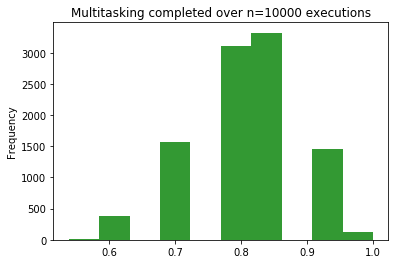

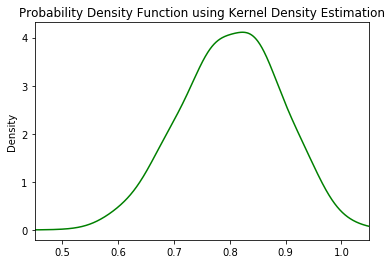

In [48]:
## my list of tasks
task_lists = [
    [0, 'Getting up at 8:00 AM.', 10, [],"morning_routine"],
    [1, 'Brushing teeth & taking a shower.', 15, [0], "morning_routine"],
    [2, 'Pouring 4 cups of water.', 2, [0,1], "morning_routine"],
    [3, 'Drinking 4 cups of water.', 2,[0,1,2], "morning_routine"],
    [4, 'Taking 2 cups of oatmeal from the box.', 2,[], "breakfast"],
    [5, 'Pouring milk into the bowl.', 1,[4], "breakfast"],
    [6, 'Mixing oatmeal and letting it stay.', 15,[4,5], "breakfast"],
    [7, 'Mixing oatmeal with peanuts, raisins, and banana.', 1, [4,5,6], "breakfast"],
    [8, 'Enjoying breakfast.', 15, [4,5,6,7],"breakfast"],
    [9, 'Washing the dish and putting it back.', 5,[4,5,6,7,8], "breakfast"],
    [10, 'Going to a family-owned traditional restaurant.', 20, [], "lunch"],
    [11, 'Choosing food and making an order.', 5,[10], "lunch"],
    [12, 'Waiting for food to come.', 20,[10,11], "lunch"],
    [13, 'Enjoying the food.', 20,[10,11,12], "lunch"],
    [14, 'Paying for food.', 5,[11,12,13], "lunch"],
    [15, 'Walking towards the bus stop.', 10, [],"evening"],
    [16, 'Choosing a bag of baked fish-shaped buns.', 5, [15],"evening"],
    [17, 'Purchasing the bag of fish-shaped buns.', 2, [15,16],"evening"],
    [18, 'Taking bus 162 to Seoul Station.', 15,[15], "evening"],
    [19, 'Taking bus 02 to Res Hall bus stop.', 15,[15,18], "evening"],
    [20, 'Walking down the hill to a residence hall.', 5,[15,18,19], "evening"],
    [21, 'Scanning a finger to enter the building.', 2,[15,18,19,20], "evening"],
    [22, 'Heading to Hyundai library to study.', 30, [],"academic"],
    [23, 'Checking in and providing details for free library passes.', 5, [22],"academic"],
    [24, 'Studying at the library in a building or traditional Korean architecture.', 180,[22,23],"academic"],
    [25, 'Checking out of the library once it closes.', 10,[23,24],"academic"],
    [26, 'Taking a bus to Ikseong village.', 30, [],"cultural"],
    [27, 'Heading to the fortune-telling exhibit with red prediction balls.', 5, [26],"cultural"],
    [28, 'Enjoying walking around the village.', 40, [26,27], "cultural"]
]

multi_lists = [
    [29, 'call family', 5, [], "multitask"], 
    [30, 'listen to music', 5, [], "multitask"],
    [31, 'listen to a podcast', 5, [], "multitask"],
    [32, 'check feedback for CS110 Preclass Work', 5, [], "multitask"],
    [33, 'compose a 4-line poem in your head', 5, [], "multitask"],
    [35, 'listen to music', 5, [], "multitask"],
    [36, 'text a friend and say hi', 3, [], "multitask"],
    [37, 'drink a bit of water', 1, [], "multitask"],
    [38, 'think about Final Project for CS110', 4, [], "multitask"],
    [39, 'think about Final Project for AH112', 4, [], "multitask"],
    [40, 'brainstorm ideas for to-do-list next weekend', 5, [], "multitask"],
    [41, 'call a friend', 10, [], "multitask"], 
    [42, 'drink a bit of water', 1, [], "multitask"], 
]

import pandas as pd

def experimental_multi_count(task_lst, multi_lst):
    multitasks_done = [] ## empty list for appending tasks
    for i in range(10000):
        ## I randomize input of task_lst every time; I do not randomize multi_lst 
        ## as we already use random.choice() in the main time_scheduler_multi_experimental() function.
        random.shuffle(task_lst)
        ## due to the nature of the functions I have defined earlier multi_lst has to be defined in a for loop
        ## for it to be used the same all the time (nothing appended, nothing deleted).
        multi_lst = [
    [29, 'call family', 5, [], "multitask"], 
    [30, 'listen to music', 5, [], "multitask"],
    [31, 'listen to a podcast', 5, [], "multitask"],
    [32, 'check feedback for CS110 Preclass Work', 5, [], "multitask"],
    [33, 'compose a 4-line poem in your head', 5, [], "multitask"],
    [35, 'listen to music', 5, [], "multitask"],
    [36, 'text a friend and say hi', 3, [], "multitask"],
    [37, 'drink a bit of water', 1, [], "multitask"],
    [38, 'think about Final Project for CS110', 4, [], "multitask"],
    [39, 'think about Final Project for AH112', 4, [], "multitask"],
    [40, 'brainstorm ideas for to-do-list next weekend', 5, [], "multitask"],
    [41, 'call a friend', 10, [], "multitask"], 
    [42, 'drink a bit of water', 1, [], "multitask"], 
]
        n_multi = len(multi_lst) ## number of all multitasks for later division of completed tasks by n_multi
        ## running the experiment, returning multitasks completed
        a = time_scheduler_multi_experimental(task_lst, multi_lst, step_sz=30, hour=8, minutes=0)
        ## getting a fraction of (completed/all) multitasks
        a = a/n_multi
        multitasks_done.append(a) ## appending those to an empty list
        ## for loop to delete the priority score and initialization of main tasks list
        ## I tried the same for multi_lst, but It didn't work and I couldn't debug it.
        for x in task_lst:
            del x[0] # deleting priority score
            del x[-1] # deleting initialization
    ## return multitasks_done ## to see all multitasks uncomment beginning of this line
    print("The mean of multitask accomplishment ratios is:", sum(multitasks_done)/len(multitasks_done))
    ## making a dataframe of all multitasks
    df = pd.DataFrame(multitasks_done)
    ## making a histogram of frequency of completed task's ratios 
    df.plot.hist(alpha=0.8, color="green", title="Multitasking completed over n=10000 executions", legend=False) 
    ## making a Probability Density Function Plot that is close to the distribution curve of the data 
    df.plot.kde(bw_method=0.5, color="green", title="Probability Density Function using Kernel Density Estimation", xlim=(0.45,1.05), legend=False)
    
experimental_multi_count(task_lists, multi_lists)

## (C)

Overall, this scheduler is computationally expensive (involves running many various functions within the time_scheduler() function), but that is fine as long as the inputs for the tasks are not too large for one day, and the output is returned immediately after the time scheduler function is called on. The implementation of a heap takes a running time of O(log N) for heappush and O(log N) for heappop, which results in O(log N+log N)=O(2log N) or just O(log N) time complexity overall. To compute overall complexity, we consider functions priority_calc(which runs n while loops in each calculating length O(1), inserting a value taking O(N), and updating the score at a specific index with O(1), resulting overall in O(N+1+1) multiplied by N, or O(N^2) complexity) and initialize_tasks(taking O(1) time complexity), functions in a while loop get_ready_tsks(appending of O(1) N times in the for loop, which equals to O(n), over time we'll be decreasing N by 1 until the list is empty), and add_tasks_pqueue(using heapify once takes O(log N), and calling on it n times results in O(N log N)). 
Additionally, the multi_tasking function randomly chooses a multitask to execute resulting in k times O(1) complexity, or O(k), with k corresponding to the number of multitasks. When adding these complexities together, the highest power should correspond to the time complexity of O(N^2), which is not very efficient; the run time scales as a function of polynomial 2 (f(x)=x^2), resulting in far larger values of running times than if we compare, for instance, to most cases with O(log N) or O(N log N).

In terms of user-friendliness, I tried to make it as user friendly as possible by requiring an input of a list of tasks for the day, current, or planned-to-start hour and minute of the day (to be converted into current c_time variable); however, it can be improved by changing the code so that a user is not required to enter all dependencies in the sublist of one task, which will also involve altering the priority calculator function a bit.

Considering the benefits and limitations of the scheduler I have programmed, I will only use it if the activities I have for the day are all of the categories I defined (until the priority calculator is modified), and If I improve it to work with the weekly time constraints (having a Minerva class at a particular time, which will stop the executing of other activity pushing it back to the priority queue back with the same highest priority (lowest score in the context of my implementation), and continuing to execute scheduling after the mandatory activity is completed; I would consider not allowing multitasking for required activities like Minerva classes and work-study meetings). 

## HCs Appendix



**#heuristics** - I have deployed a simple heuristics strategy, like a rule of thumb for decision making, when defining and implementing the multitasking time scheduler; it is code-wise based on a few if statements (if between min and max of durations of multitasks, randomly choosing an activity, if the remaining time is bigger than the duration of activity - executing it and updating the list of multitasks). This heuristic is computationally inexpensive, taking only O(1) time complexity in the algorithm; however, I realize it will not be the most effective due to the implementation of only 80% of multitasks (on average) that I will do throughout the day.

**#constraints** - I have described how the time scheduler works within the given set of constraints (time constraints) and how that relates to using priority queue and MinHeap. I have also identified the limitations of the approach I took to implement time scheduler for part 1 and part 2 (multitasking), specifically how the priority calculator function is limiting in terms of categories identified and scoring system, and how I might not be able to execute all possible multitasks for the day given this input and randomized choice of the multitask.

**#descriptivestats** - using available pandas functions to plot a histogram and distribution of data (probability distribution in this case), I wanted to compute and show the average accomplishment of multitasks (ratio of completed over all possible multitasks for the day) after the time scheduler runs a large number of times (n=10000). The analysis of the mean allowed me to interpret how effective, on average, this approach can be if I combine main tasks (n=29) and multitasks (n=13) execution. 

**Note:** I was working on this assignment in multiple jupyter notebooks (each for separate task), thus this document is not a draft I started with, and it is just a compiled final version of every coding part added together. The run times in this notebook are not the same as I had in my working notebooks (those range from at least 100 to 200 times). 

---